In [1]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
from scipy.io import loadmat, savemat

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.pipeline import make_pipeline
import os
# import src.fitting as fitting
import src.multielec_utils as mutils
from mpl_toolkits.mplot3d import Axes3D
from scipy.optimize import minimize
import sys
sys.path.append('/Volumes/Lab/Users/jeffbrown/electrical_spike_sorting/utils/')
sys.path.append('/Volumes/Lab/Users/AlexG/pystim/python-libraries/')
import eilib_new as eil
import src.utilities.visionloader as vl

%load_ext autoreload
%autoreload 2
%matplotlib ipympl

/Volumes/Lab/Users/jeffbrown/g-sort/src/utilities/electrode_map.py:517: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  LITKE_512_ARRAY_ADJ_MAT = np.array([
/Volumes/Lab/Users/jeffbrown/g-sort/src/utilities/electrode_map.py:1552: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  LITKE_519_ARRAY_ADJ_MAT = np.array([


In [2]:
ANALYSIS_BASE = "/Volumes/Analysis"

In [22]:
gsort_path = "/Volumes/Scratch/Users/jeffbrown/final_tests4/"
dataset = "2020-09-29-2"
estim = "data007/data007-all"
wnoise = "kilosort_data002/data002"
thr_factor = 1


p_thr = 2/19
p_upper = 1

electrical_path = os.path.join(ANALYSIS_BASE, dataset, estim)
vis_datapath = os.path.join(ANALYSIS_BASE, dataset, wnoise)

vis_datarun = wnoise.split('/')[-1]
vcd = vl.load_vision_data(
    vis_datapath,
    vis_datarun,
    include_neurons=True,
    include_ei=True,
    include_params=True,
    include_noise=True,
)
channel_noise = vcd.channel_noise
coords = vcd.get_electrode_map()


filepath = os.path.join(gsort_path, 
                        dataset, estim, wnoise)




# full_data_tensor = loadmat(os.path.join(filepath,'gsort_full_data_tensor.mat'))



In [23]:
gsorted_cells = full_data_tensor['gsorted_cells'].flatten()
cells = full_data_tensor['cells'].flatten()
probs = full_data_tensor['probs']
filtered_probs = full_data_tensor['filtered_probs']
run = full_data_tensor['run']

In [28]:
np.sum(filtered_probs>0)

39083

/tmp/ipykernel_31666/3274418613.py:19: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


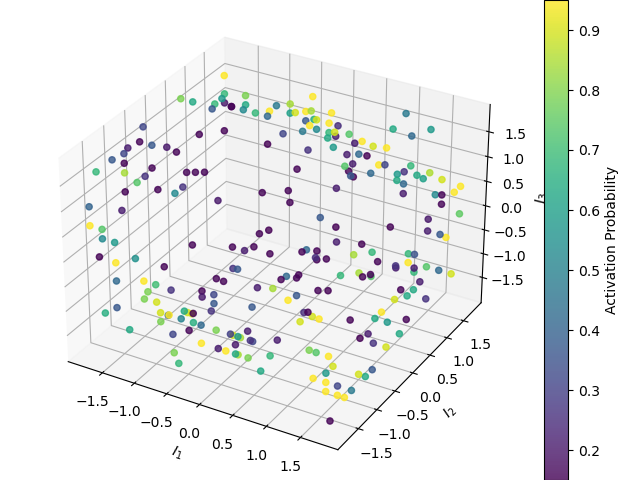

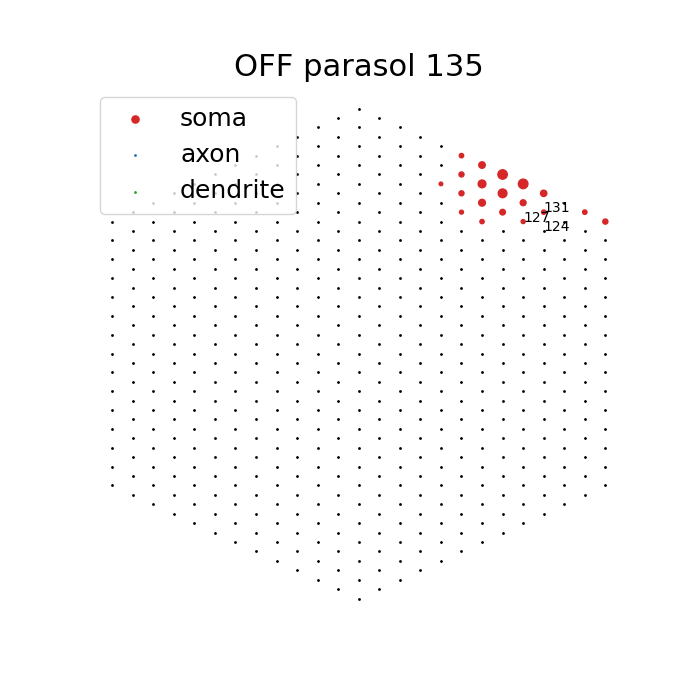

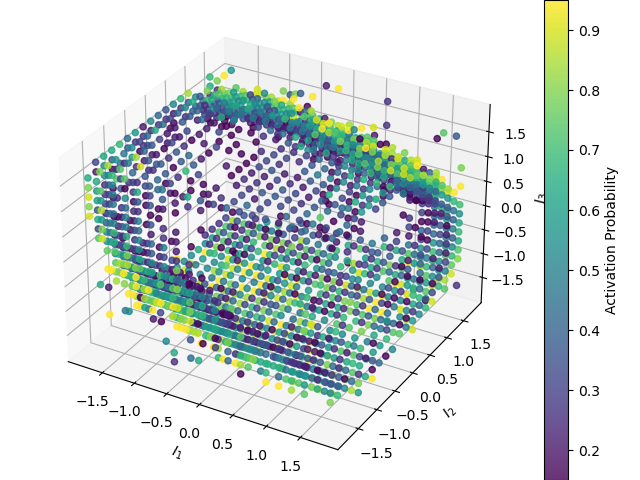

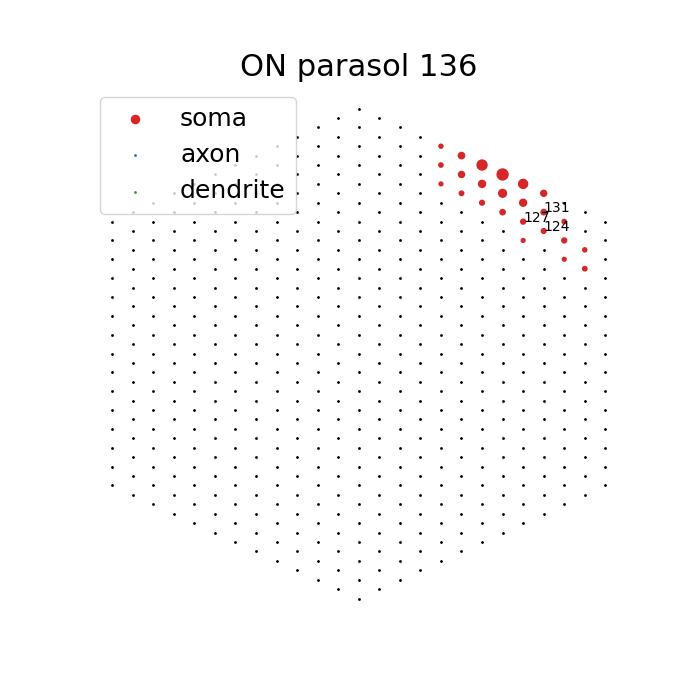

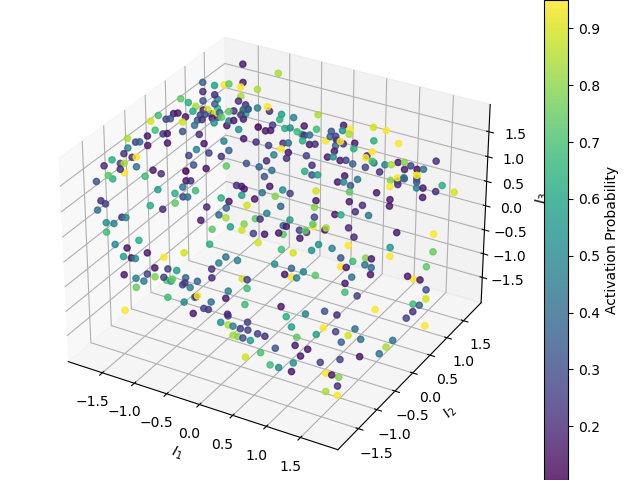

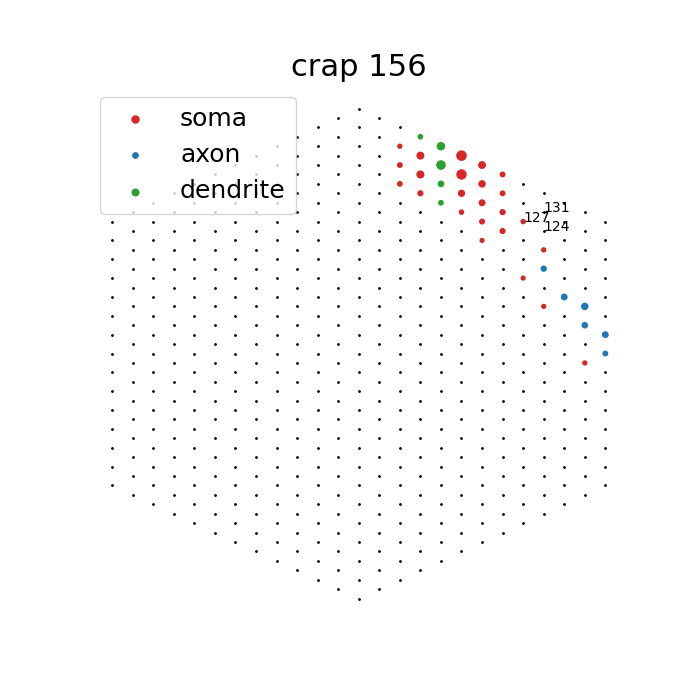

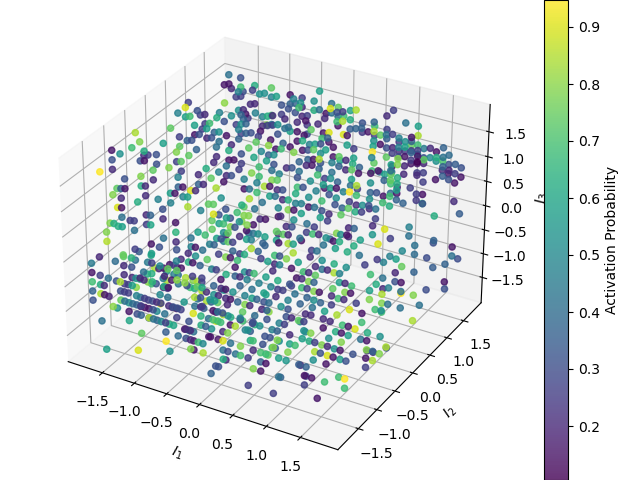

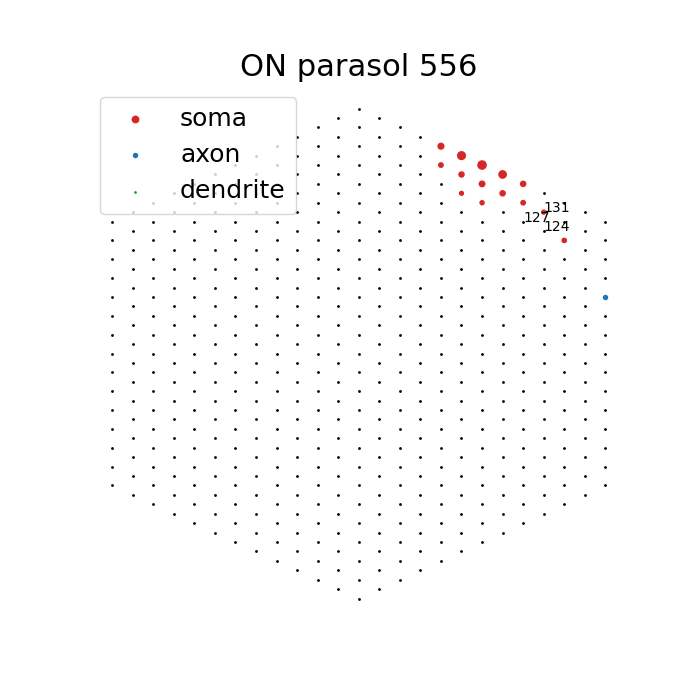

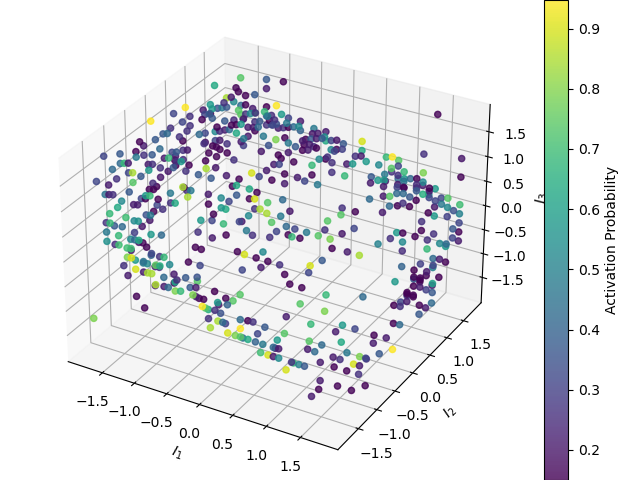

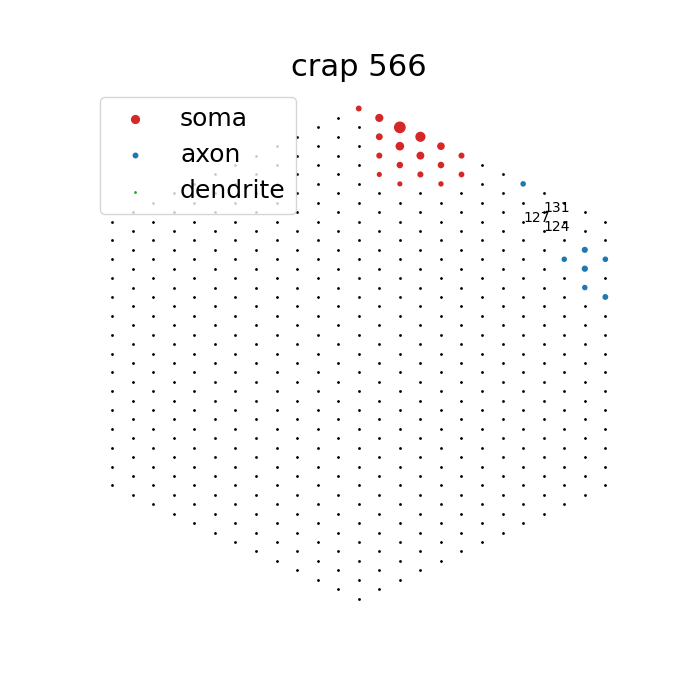

In [33]:
for ni, pi in np.argwhere(run):
    p = pi+1
    n = cells[ni]
    
    if n not in [556,566,156, 136, 135]:
        continue

    triplet_elecs = mutils.get_stim_elecs_newlv(electrical_path, p)
    amplitudes = mutils.get_stim_amps_newlv(electrical_path, p)
    num_pts = len(np.where(np.any(amplitudes != 0, axis=1))[0])


    triplet_probs = filtered_probs[list(cells).index(n), p-1]


    good_inds = np.where((triplet_probs > p_thr) & (triplet_probs < p_upper))[0]

    fig = plt.figure()
    ax = Axes3D(fig)
    plt.xlabel(r'$I_1$')
    plt.ylabel(r'$I_2$')
    ax.set_zlabel(r'$I_3$')

    scat = ax.scatter(amplitudes[:, 0][good_inds], 
                amplitudes[:, 1][good_inds],
                amplitudes[:, 2][good_inds], marker='o', s=20, c=triplet_probs[good_inds], alpha=0.8)

    clb = plt.colorbar(scat)
    clb.set_label('Activation Probability')
    plt.show()

    fig, ax = plt.subplots(figsize=(7, 7))
    ax.scatter(coords[:, 0], coords[:, 1], s=1, c="k")

    good_inds, EI = mutils.get_collapsed_ei_thr(vcd, n, thr_factor)
    cell_ei = vcd.get_ei_for_cell(n).ei
    comp = []
    for i in range(len(cell_ei)):
        comp.append(eil.axonorsoma(cell_ei[i]))
    comp = np.asarray(comp)

    soma_inds = good_inds[np.where(comp[good_inds] == 'soma')]
    axon_inds = good_inds[np.where(comp[good_inds] == 'axon')]
    dendrite_inds = good_inds[np.where(comp[good_inds] == 'dendrite')]

    ax.scatter(coords[soma_inds, 0], coords[soma_inds, 1], s=np.abs(EI[soma_inds]) * 2, c='tab:red', label='soma')
    ax.scatter(coords[axon_inds, 0], coords[axon_inds, 1], s=np.abs(EI[axon_inds]) * 2, c='tab:blue', label='axon')
    ax.scatter(coords[dendrite_inds, 0], coords[dendrite_inds, 1], s=np.abs(EI[dendrite_inds]) * 2,
                c='tab:green', label='dendrite')
    plt.title(vcd.get_cell_type_for_cell(n) + " " + str(n), fontsize=22)

    for i, txt in enumerate(triplet_elecs):
        ax.annotate(txt, (coords[triplet_elecs[i]-1, 0], coords[triplet_elecs[i]-1, 1]), c='k')

    ax.axis('off')
    ax.legend(fontsize=18, loc="best")
    plt.show()

/tmp/ipykernel_31666/2770207241.py:20: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


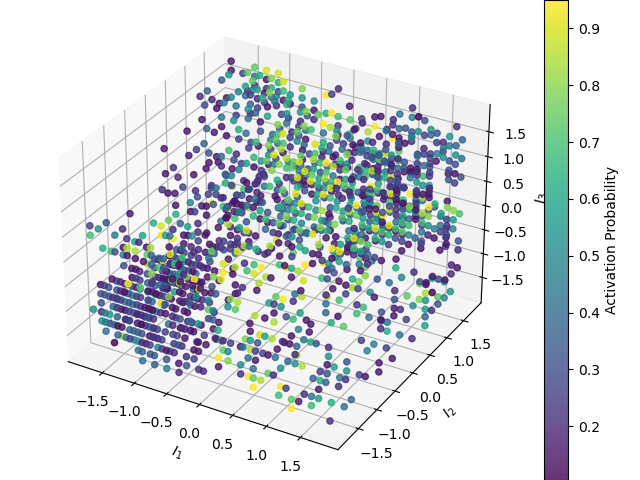

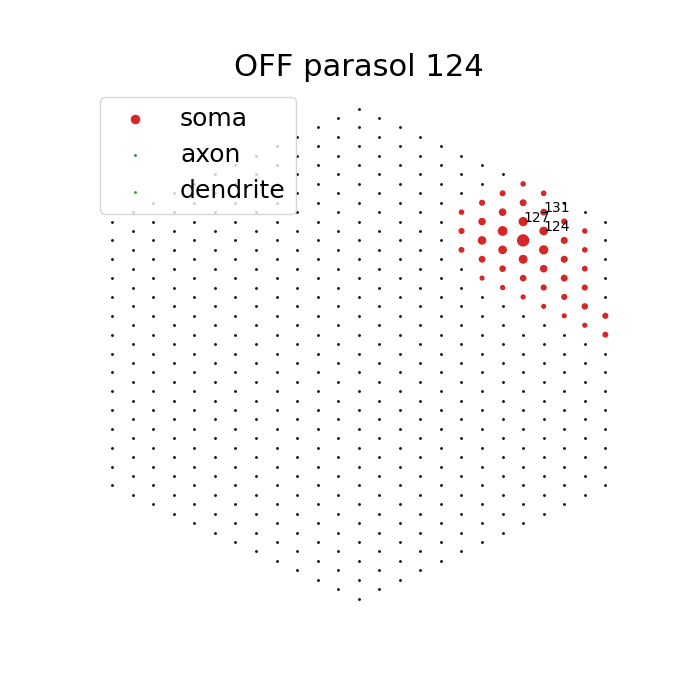

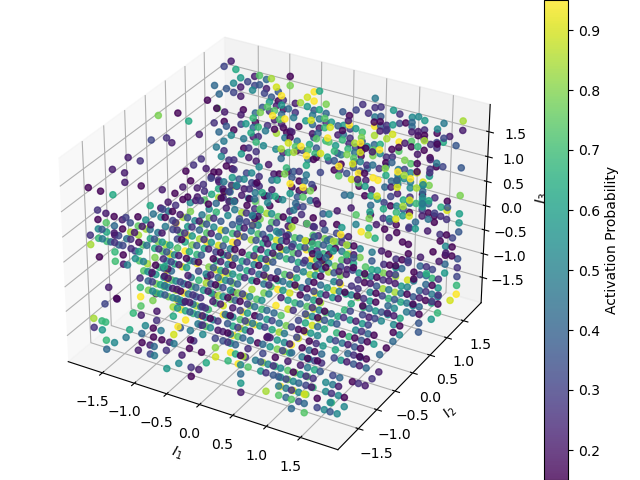

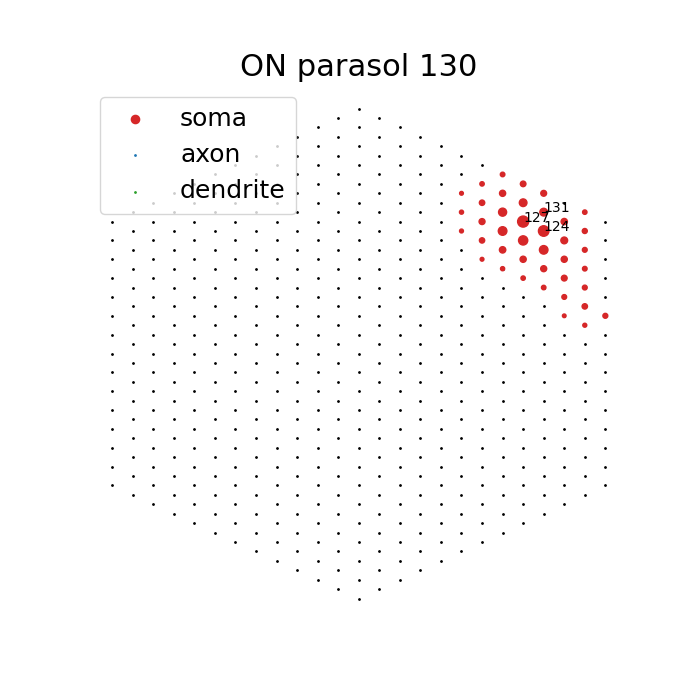

In [46]:
for ni, pi in np.argwhere(run):
    p = pi+1
    n = cells[ni]
    
#     if n in [556,156,566, 136, 135]:
    if n not in [124, 130]:
        continue

    triplet_elecs = mutils.get_stim_elecs_newlv(electrical_path, p)
    amplitudes = mutils.get_stim_amps_newlv(electrical_path, p)
    num_pts = len(np.where(np.any(amplitudes != 0, axis=1))[0])


    triplet_probs = filtered_probs[list(cells).index(n), p-1]


    good_inds = np.where((triplet_probs > p_thr) & (triplet_probs < p_upper))[0]

    fig = plt.figure()
    ax = Axes3D(fig)
    plt.xlabel(r'$I_1$')
    plt.ylabel(r'$I_2$')
    ax.set_zlabel(r'$I_3$')

    scat = ax.scatter(amplitudes[:, 0][good_inds], 
                amplitudes[:, 1][good_inds],
                amplitudes[:, 2][good_inds], marker='o', s=20, c=triplet_probs[good_inds], alpha=0.8)

    clb = plt.colorbar(scat)
    clb.set_label('Activation Probability')
    plt.show()

    fig, ax = plt.subplots(figsize=(7, 7))
    ax.scatter(coords[:, 0], coords[:, 1], s=1, c="k")

    good_inds, EI = mutils.get_collapsed_ei_thr(vcd, n, thr_factor)
    cell_ei = vcd.get_ei_for_cell(n).ei
    comp = []
    for i in range(len(cell_ei)):
        comp.append(eil.axonorsoma(cell_ei[i]))
    comp = np.asarray(comp)

    soma_inds = good_inds[np.where(comp[good_inds] == 'soma')]
    axon_inds = good_inds[np.where(comp[good_inds] == 'axon')]
    dendrite_inds = good_inds[np.where(comp[good_inds] == 'dendrite')]

    ax.scatter(coords[soma_inds, 0], coords[soma_inds, 1], s=np.abs(EI[soma_inds]) * 2, c='tab:red', label='soma')
    ax.scatter(coords[axon_inds, 0], coords[axon_inds, 1], s=np.abs(EI[axon_inds]) * 2, c='tab:blue', label='axon')
    ax.scatter(coords[dendrite_inds, 0], coords[dendrite_inds, 1], s=np.abs(EI[dendrite_inds]) * 2,
                c='tab:green', label='dendrite')
    plt.title(vcd.get_cell_type_for_cell(n) + " " + str(n), fontsize=22)

    for i, txt in enumerate(triplet_elecs):
        ax.annotate(txt, (coords[triplet_elecs[i]-1, 0], coords[triplet_elecs[i]-1, 1]), c='k')

    ax.axis('off')
    ax.legend(fontsize=18, loc="best")
    plt.show()

/tmp/ipykernel_31666/1423529274.py:30: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


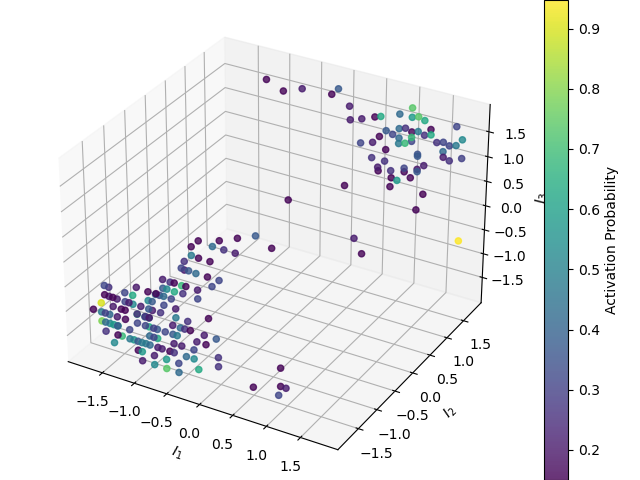

In [48]:

p = 1
n = 124

triplet_elecs = mutils.get_stim_elecs_newlv(electrical_path, p)
amplitudes = mutils.get_stim_amps_newlv(electrical_path, p)
num_pts = len(np.where(np.any(amplitudes != 0, axis=1))[0])


triplet_probs_1 = filtered_probs[list(cells).index(n), p-1]


good_inds_1 = (triplet_probs_1 > p_thr) & (triplet_probs_1 < p_upper)


p = 1
n = 110

triplet_elecs = mutils.get_stim_elecs_newlv(electrical_path, p)
amplitudes = mutils.get_stim_amps_newlv(electrical_path, p)
num_pts = len(np.where(np.any(amplitudes != 0, axis=1))[0])


triplet_probs_2 = filtered_probs[list(cells).index(n), p-1]


good_inds_2 = (triplet_probs_2 > p_thr) & (triplet_probs_2 < p_upper)

good_inds =good_inds_2 * good_inds_1#* (triplet_probs_2+triplet_probs_1<=1)
fig = plt.figure()
ax = Axes3D(fig)
plt.xlabel(r'$I_1$')
plt.ylabel(r'$I_2$')
ax.set_zlabel(r'$I_3$')

scat = ax.scatter(amplitudes[:, 0][good_inds], 
            amplitudes[:, 1][good_inds],
            amplitudes[:, 2][good_inds], marker='o', s=20, c=(triplet_probs_2)[good_inds], alpha=0.8)

clb = plt.colorbar(scat)
clb.set_label('Activation Probability')
plt.show()


/tmp/ipykernel_31666/4146400075.py:20: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


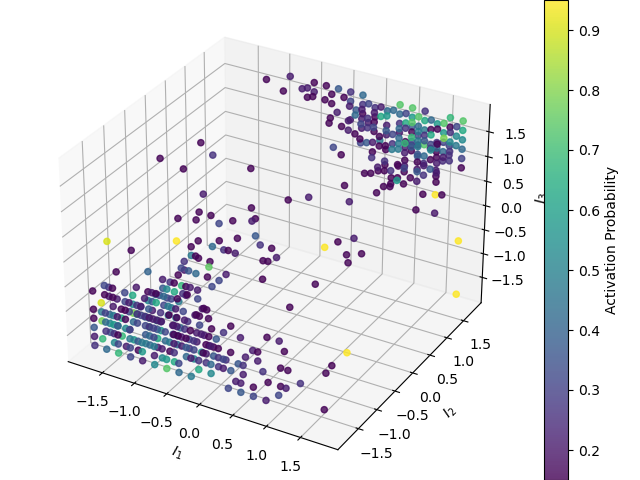

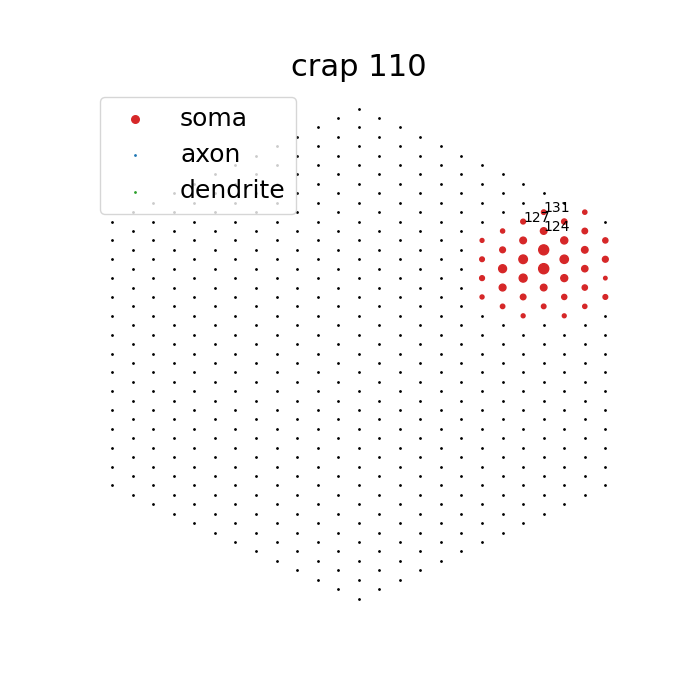

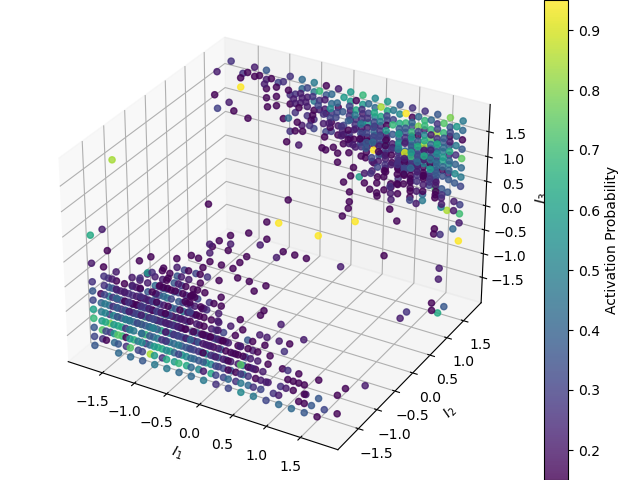

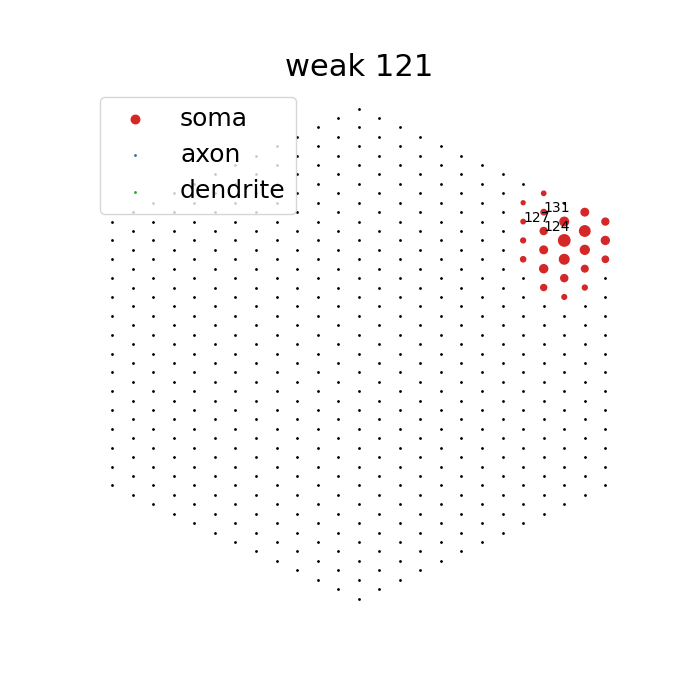

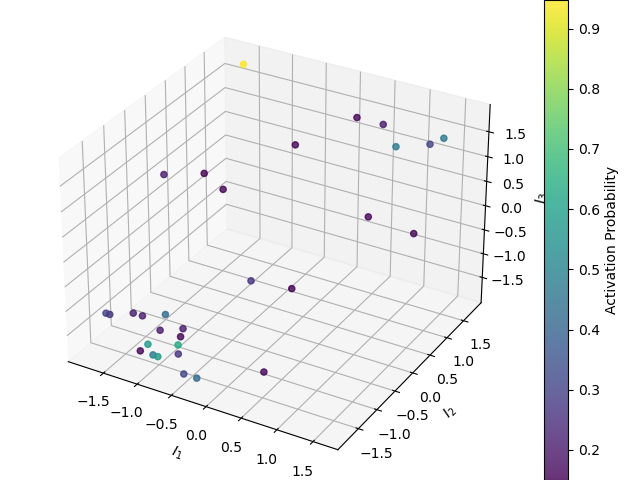

...

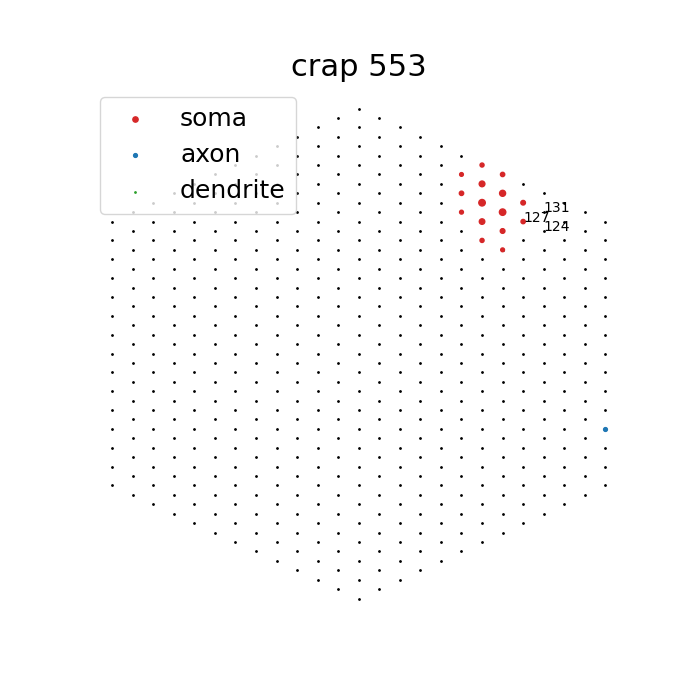

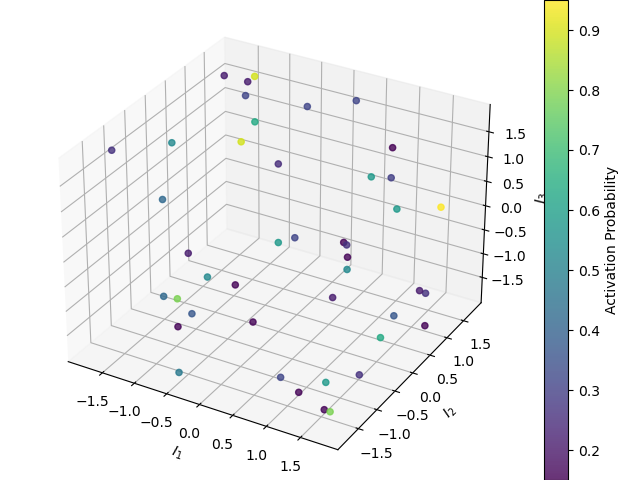

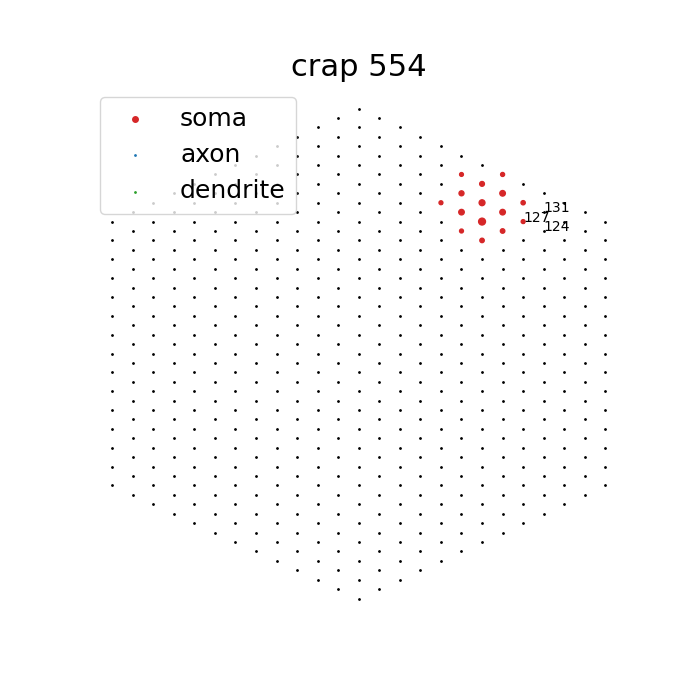

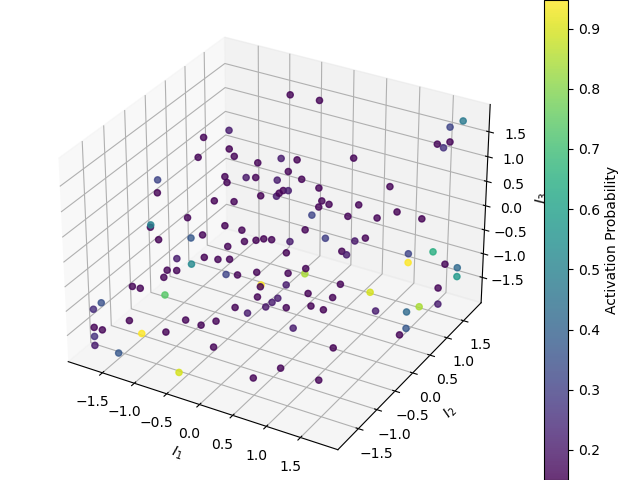

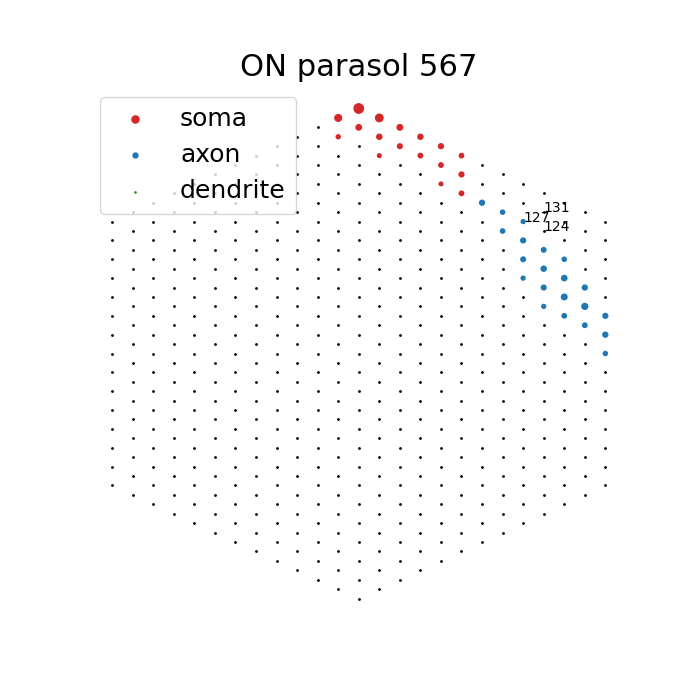

In [36]:
for ni, pi in np.argwhere(run):
    p = pi+1
    n = cells[ni]
    
    if n in [556,156,566, 136, 135,124, 130]:
#     if n not in [124, 130]:
        continue

    triplet_elecs = mutils.get_stim_elecs_newlv(electrical_path, p)
    amplitudes = mutils.get_stim_amps_newlv(electrical_path, p)
    num_pts = len(np.where(np.any(amplitudes != 0, axis=1))[0])


    triplet_probs = filtered_probs[list(cells).index(n), p-1]


    good_inds = np.where((triplet_probs > p_thr) & (triplet_probs < p_upper))[0]

    fig = plt.figure()
    ax = Axes3D(fig)
    plt.xlabel(r'$I_1$')
    plt.ylabel(r'$I_2$')
    ax.set_zlabel(r'$I_3$')

    scat = ax.scatter(amplitudes[:, 0][good_inds], 
                amplitudes[:, 1][good_inds],
                amplitudes[:, 2][good_inds], marker='o', s=20, c=triplet_probs[good_inds], alpha=0.8)

    clb = plt.colorbar(scat)
    clb.set_label('Activation Probability')
    plt.show()

    fig, ax = plt.subplots(figsize=(7, 7))
    ax.scatter(coords[:, 0], coords[:, 1], s=1, c="k")

    good_inds, EI = mutils.get_collapsed_ei_thr(vcd, n, thr_factor)
    cell_ei = vcd.get_ei_for_cell(n).ei
    comp = []
    for i in range(len(cell_ei)):
        comp.append(eil.axonorsoma(cell_ei[i]))
    comp = np.asarray(comp)

    soma_inds = good_inds[np.where(comp[good_inds] == 'soma')]
    axon_inds = good_inds[np.where(comp[good_inds] == 'axon')]
    dendrite_inds = good_inds[np.where(comp[good_inds] == 'dendrite')]

    ax.scatter(coords[soma_inds, 0], coords[soma_inds, 1], s=np.abs(EI[soma_inds]) * 2, c='tab:red', label='soma')
    ax.scatter(coords[axon_inds, 0], coords[axon_inds, 1], s=np.abs(EI[axon_inds]) * 2, c='tab:blue', label='axon')
    ax.scatter(coords[dendrite_inds, 0], coords[dendrite_inds, 1], s=np.abs(EI[dendrite_inds]) * 2,
                c='tab:green', label='dendrite')
    plt.title(vcd.get_cell_type_for_cell(n) + " " + str(n), fontsize=22)

    for i, txt in enumerate(triplet_elecs):
        ax.annotate(txt, (coords[triplet_elecs[i]-1, 0], coords[triplet_elecs[i]-1, 1]), c='k')

    ax.axis('off')
    ax.legend(fontsize=18, loc="best")
    plt.show()